In [13]:
# load packages
using MIRTjim
using Plots
using FFTW
using Random
using LinearAlgebra
using MAT
using LinearMapsAA
using pisco

In [14]:
# read in data from mat file
img_true = matread("../data/2D_fmri_phantom_data.mat")["img_true"];
kdata = matread("../data/2D_fmri_phantom_data.mat")["kdata"];
kmask = matread("../data/2D_fmri_phantom_data.mat")["kmask"];
act_true = matread("../data/2D_fmri_phantom_data.mat")["act_true"];

# get sizes
nd = ndims(kdata) - 1; # number of image dimensions
N = size(kdata)[1:nd]; # image size
T = size(kdata, nd + 1); # number of frames

┌ Info: Saved animation to /tmp/jl_ytI7chIzyF.gif
└ @ Plots /home/djfrey/.julia/packages/Plots/8ZnR3/src/animation.jl:156


Plots.AnimatedGif("/tmp/jl_ytI7chIzyF.gif")
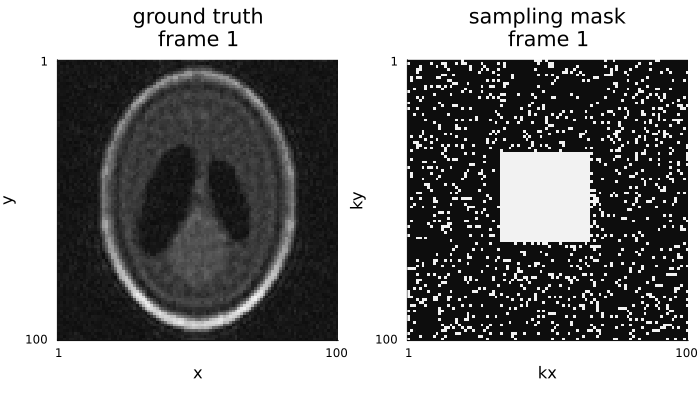

In [15]:
# show the multi-frame image data
idata = iftnd(kdata; dims=1:2);
@gif for i in 1:size(idata,3)
    p1 = jim(idata[:,:,i]; colorbar=false, title="ground truth\nframe $i", xlabel="x", ylabel="y")
    p2 = jim(kmask[:,:,i]; colorbar=false, title="sampling mask\nframe $i", xlabel="kx", ylabel="ky")
    plot(p1,p2,layout=(1,2), size=(700,400))
end fps=4 verbose=false

In [16]:
# set PISCO techniques
kernel_shape = 1; # (0 for rect, 1 for circle)
fft_C_mtx = true; # option to approximate ChC with FFTs
sketched_SVD = true; # option to used sketched (randomized) SVD
subspace_itr_G = false; # option to use subspace iteration to compute nullspace vectors of G
fft_interp = true; # option to use FFTs to interpolate G matrix

# set PISCO parameters
τ = Int(3); # neighborhood size (radius)
N_cal = (32,32); # size of calibration region
σ_thresh = 0.002; # threshold for singular values
d_sk = 50; # sketch dimension for SVD of ChC (overestimation of the rank)
N_gzp = 24; # number of vo/pixels to interpolate (zero-pad) in each dimension of G matrix
α = 100; # Gaussian window parameter for phase normalization
L = 4; # number of sensitivity map sets to estimate

In [ ]:
# estimate the spatiotemporal maps by calling the pisco_smaps function
stmaps, λ, _ = pisco_smaps(kdata;
    kernel_shape=kernel_shape,
    fft_C_mtx=fft_C_mtx,
    sketched_SVD=sketched_SVD,
    subspace_itr_G=subspace_itr_G,
    fft_interp=fft_interp,
    τ=τ,
    N_cal=N_cal,
    N=N,
    σ_thresh=σ_thresh,
    d_sk=d_sk,
    N_gzp=N_gzp,
    α=α,
    L=L,
    verbose=true);

PISCO parameters:
	kernel shape: circular
	kernel radius (τ): 3
	calibration region size: (32, 32)
	number of coils: 150
	number of kernel points: 29
	fft_C_mtx: yes
	sketch_SVD: yes
	subspace_itr_G: no
	sketch dimension (d_sk): 50
	σ_thresh: 0.002
	N_gzp: 24
	α (Gaussian window parameter): 100
	L (number of sensitivity maps to estimate): 4
forming convolution gram matrix ChC... 
done.
	computation time: 4.43266487121582 seconds
computing nullspace of ChC... 
done.
	computation time: 2.012465000152588 seconds
	estimated rank(ChC): 28
forming G matrix... 
done.
	computation time: 8.664677143096924 seconds
estimating sensitivity maps from nullspace of G... 
done.
	computation time: 10.78832197189331 seconds
normalizing phase of the sensitivity maps... 
done.
interpolating sensitivity maps... 
done.
total time: 25.898128986358643 seconds


In [18]:
# show the spatiotemporal maps
p = Vector(undef, L);
@gif for i in 1:size(idata,3)
    for l in 1:L
        p[l] = jim(stmaps[:,:,i,l]; colorbar=false, title="S_$l\nframe $i", xlabel="x", ylabel="y")
    end
    plot(p..., layout=(1,L), size=(L*400 - 100,400))
end fps=4 verbose=false

UndefVarError: UndefVarError: `stmaps` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [19]:
# create spatiotemporal map encoding operator
S = LinearMapAA(
    x -> sum(reshape(x, (N..., 1, L)) .* stmaps, dims=nd+2), # forward: N x N x L -> N x N x T
    y -> sum(conj.(stmaps) .* y, dims=nd+1), # adjoint: N x N x T -> N x N x L
    (prod(N)*T, prod(N)*L); # operator size
    T=ComplexF64, # data type
    idim=(N...,L), # input dimensions
    odim=(N...,T) # output dimensions
    );

# define forward Fourier transform operator (block diagonal)
F = LinearMapAA(
    x -> ftnd(x; dims=1:nd), # forward: fft
    y -> iftnd(y; dims=1:nd), # adjoint: inverse fft
    (prod(N)*T, prod(N)*T); # operator size
    T=ComplexF64, # data type
    idim=(N...,T), # input dimensions
    odim=(N...,T) # output dimensions
);

# define masking operator (block diagonal)
M = LinearMapAA(
    x -> x .* kmask, # forward: apply mask
    y -> y .* conj.(kmask), # adjoint: apply conjugate mask
    (prod(N)*T, prod(N)*T); # operator size
    T=ComplexF64, # data type
    idim=(N...,T), # input dimensions
    odim=(N...,T) # output dimensions
);

# create composite system matrix
A = LinearMapAA(
    x -> M*(F*(S*x)), # forward: N x N x L -> N x N x T
    y -> S'*(F'*(M'*y)), # adjoint: N x N x T -> N x N x L
    (prod(N)*T, prod(N)*L); # operator size
    T=ComplexF64, # data type
    idim=(N...,L), # input dimensions
    odim=(N...,T) # output dimensions
    );

In [20]:
# solve for coeffificent maps with CG
ρl_star = cg(A, zeros(ComplexF64, (N...,L)), kdata; niter=30);

UndefVarError: UndefVarError: `stmaps` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [21]:
# show the coefficient images
p = Vector(undef, L);
for l in 1:L
    p[l] = jim(ρl_star[:,:,l]; colorbar=false, title="coefficient map ρ_$l", xlabel="x", ylabel="y")
end
plot(p..., layout=(1,L), size=(L*400-100, 400))

UndefVarError: UndefVarError: `ρl_star` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [22]:
# get reconstructed timeseries images
ρ_star = S*ρl_star;

# calculate NRMSE with respect to ground truth image
@show nrmse = norm(ρ_star[:] .- img_true[:], 2) / norm(img_true[:], 2);

UndefVarError: UndefVarError: `ρl_star` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [23]:
# show the image timeseries
@gif for t in 1:T
    p1 = jim(img_true[:,:,t]; colorbar=false, title="ground truth\nframe $t", xlabel="x", ylabel="y")
    p2 = jim(idata[:,:,t]; colorbar=false, title="IFFT\nframe $t", xlabel="x", ylabel="y")
    p3 = jim(ρ_star[:,:,t]; colorbar=false, title="STM reconstruction\nframe $t", xlabel="x", ylabel="y")
    plot(p1,p2,p3,layout=(1,3), size=(1100,400))
end fps=4 verbose=false

UndefVarError: UndefVarError: `ρ_star` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

In [24]:
# show timecourse at active voxel
act_px = (50,10);

p1 = plot(img_true[act_px..., :]; label="ground truth")
plot!(abs.(idata[act_px..., :]); label="IFFT")
plot!(abs.(ρ_star[act_px..., :]); label="STM reconstruction")
xlabel!("time")
ylabel!("signal")
title!("Timecourse at voxel $act_px")


UndefVarError: UndefVarError: `ρ_star` not defined in `Main`
Suggestion: check for spelling errors or missing imports.